# VGGT Demo - Gradio Interface Simulation

This notebook simulates the Gradio interface functionality for VGGT 3D reconstruction without running a web server.

## Features
- Simulate Gradio interface processing pipeline
- Load VGGT model for 3D scene reconstruction
- Process multiple image uploads
- Generate downloadable outputs (depth maps, point clouds)
- Create visualization galleries

In [1]:
# Configure matplotlib for high-resolution outputs
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300

In [2]:
# Import required packages
import os
import sys
import numpy as np
import torch
import torch.nn.functional as F
from pathlib import Path
import glob
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import shutil
import json

print("Basic imports successful")

Basic imports successful


In [3]:
# Import VGGT modules
try:
    from vggt.models.vggt import VGGT
    from vggt.utils.load_fn import load_and_preprocess_images_square
    from vggt.utils.geometry import unproject_depth_map_to_point_map
    print("VGGT imports successful")
except ImportError as e:
    print(f"VGGT import error: {e}")
    # Fallback to basic functionality if VGGT is not available
    raise

/Users/speed/Downloads/Paper2Agent/VGGT_Agent/repo/vggt-env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


VGGT imports successful


In [4]:
# Set device and data type
device = "cuda" if torch.cuda.is_available() else "cpu"
if device == "cuda":
    try:
        dtype = torch.bfloat16 if torch.cuda.get_device_capability()[0] >= 8 else torch.float16
    except:
        dtype = torch.float16
else:
    dtype = torch.float32

print(f"Using device: {device}")
print(f"Using dtype: {dtype}")

Using device: cpu
Using dtype: torch.float32


In [5]:
# Load VGGT model with timeout handling
print("Loading VGGT model...")
try:
    # Use the alternative loading method from demo_colmap.py if from_pretrained fails
    try:
        model = VGGT.from_pretrained("facebook/VGGT-1B").to(device)
    except Exception as e:
        print(f"from_pretrained failed: {e}")
        print("Trying alternative loading method...")
        model = VGGT()
        _URL = "https://huggingface.co/facebook/VGGT-1B/resolve/main/model.pt"
        model.load_state_dict(torch.hub.load_state_dict_from_url(_URL))
        model = model.to(device)
    
    model.eval()
    print("Model loaded successfully!")
except Exception as e:
    print(f"Model loading failed: {e}")
    raise

Loading VGGT model...


Model loaded successfully!


In [6]:
# Create output directory structure
output_base_dir = Path("notebooks/demo_gradio/outputs")
output_base_dir.mkdir(parents=True, exist_ok=True)

# Create subdirectories for different output types
depth_dir = output_base_dir / "depth_maps"
confidence_dir = output_base_dir / "confidence_maps"
pointcloud_dir = output_base_dir / "point_clouds"
gallery_dir = output_base_dir / "gallery"

for dir_path in [depth_dir, confidence_dir, pointcloud_dir, gallery_dir]:
    dir_path.mkdir(exist_ok=True)

print(f"Output directories created at: {output_base_dir}")

Output directories created at: notebooks/demo_gradio/outputs


In [7]:
# Gradio simulation functions
def process_images_with_vggt(image_paths, output_dir="notebooks/demo_gradio/outputs"):
    """
    Simulate the main Gradio processing function.
    This function would normally be called when user uploads images in Gradio interface.
    """
    print(f"Processing {len(image_paths)} images...")
    
    # Load and preprocess images
    resolution = 518
    images, original_coords = load_and_preprocess_images_square(image_paths, resolution)
    images = images.to(device)
    
    # Run VGGT inference
    print("Running VGGT inference...")
    with torch.no_grad():
        with torch.cuda.amp.autocast(dtype=dtype, enabled=(device == "cuda")):
            predictions = model(images)
    
    # Extract predictions safely
    print("Extracting predictions...")
    for key, value in predictions.items():
        print(f"{key}: {value.shape if hasattr(value, 'shape') else type(value)}")
    
    # Extract based on actual prediction keys
    depth_maps = predictions['depth'].cpu().numpy()
    confidence_maps = predictions['depth_conf'].cpu().numpy()  # Use depth_conf instead of confidence
    world_points = predictions['world_points'].cpu().numpy()
    world_points_conf = predictions['world_points_conf'].cpu().numpy()
    
    # Generate camera matrices from pose encoding
    from vggt.utils.pose_enc import pose_encoding_to_extri_intri
    extrinsics, intrinsics = pose_encoding_to_extri_intri(predictions["pose_enc"], images.shape[-2:])
    
    # Use the world_points directly from VGGT predictions instead of generating from depth maps
    # This avoids the shape and intrinsic matrix issues
    point_clouds = world_points.squeeze(0)  # Remove batch dimension: (1, 8, 518, 518, 3) -> (8, 518, 518, 3)
    
    results = {
        'images': images,
        'depth_maps': depth_maps.squeeze(0).squeeze(-1),  # Squeeze for visualization: (1, 8, 518, 518, 1) -> (8, 518, 518)
        'confidence_maps': confidence_maps.squeeze(0),  # Remove batch dimension: (1, 8, 518, 518) -> (8, 518, 518)
        'point_clouds': point_clouds,
        'world_points': world_points,
        'world_points_conf': world_points_conf,
        'extrinsics': extrinsics,
        'intrinsics': intrinsics,
        'original_coords': original_coords
    }
    
    return results

def create_visualizations(results, output_dir):
    """
    Create visualization outputs that would be displayed in Gradio gallery.
    """
    output_files = []
    
    depth_maps = results['depth_maps']
    confidence_maps = results['confidence_maps']
    images = results['images']
    point_clouds = results['point_clouds']
    
    # Save individual depth maps
    for i, depth_map in enumerate(depth_maps):
        fig, ax = plt.subplots(figsize=(8, 6))
        im = ax.imshow(depth_map, cmap='viridis')
        ax.set_title(f'Depth Map {i+1}')
        ax.axis('off')
        plt.colorbar(im, ax=ax)
        
        depth_file = Path(output_dir) / "depth_maps" / f"depth_{i+1}.png"
        plt.savefig(depth_file, dpi=300, bbox_inches='tight')
        plt.close()
        output_files.append(depth_file)
    
    # Save individual confidence maps
    for i, conf_map in enumerate(confidence_maps):
        fig, ax = plt.subplots(figsize=(8, 6))
        im = ax.imshow(conf_map, cmap='plasma')
        ax.set_title(f'Confidence Map {i+1}')
        ax.axis('off')
        plt.colorbar(im, ax=ax)
        
        conf_file = Path(output_dir) / "confidence_maps" / f"confidence_{i+1}.png"
        plt.savefig(conf_file, dpi=300, bbox_inches='tight')
        plt.close()
        output_files.append(conf_file)
    
    # Create combined visualization gallery
    num_images = len(depth_maps)
    fig, axes = plt.subplots(3, num_images, figsize=(4*num_images, 12))
    if num_images == 1:
        axes = axes.reshape(3, 1)
    
    for i in range(num_images):
        # Original image - use direct indexing like demo_viser 
        img_np = images[i].cpu().permute(1, 2, 0).numpy()
        img_np = np.clip(img_np, 0, 1)
        axes[0, i].imshow(img_np)
        axes[0, i].set_title(f'Input Image {i+1}')
        axes[0, i].axis('off')
        
        # Depth map
        im1 = axes[1, i].imshow(depth_maps[i], cmap='viridis')
        axes[1, i].set_title(f'Depth Map {i+1}')
        axes[1, i].axis('off')
        
        # Confidence map
        im2 = axes[2, i].imshow(confidence_maps[i], cmap='plasma')
        axes[2, i].set_title(f'Confidence {i+1}')
        axes[2, i].axis('off')
    
    plt.suptitle('VGGT Processing Results Gallery')
    plt.tight_layout()
    
    gallery_file = Path(output_dir) / "gallery" / "results_gallery.png"
    plt.savefig(gallery_file, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    output_files.append(gallery_file)
    
    return output_files

def create_3d_visualization(results, output_dir, confidence_threshold=0.5):
    """
    Create 3D point cloud visualization that would be shown in Gradio 3D viewer.
    """
    point_clouds = results['point_clouds']
    confidence_maps = results['confidence_maps']
    images = results['images']
    
    # Collect valid 3D points from all views
    all_points = []
    all_colors = []
    
    for i in range(len(point_clouds)):
        # Get confidence mask
        conf_mask = confidence_maps[i] > confidence_threshold
        
        # Get valid 3D points
        valid_points = point_clouds[i][conf_mask]
        
        # Get corresponding colors from original image - use direct indexing like demo_viser
        img_rgb = images[i].cpu().permute(1, 2, 0).numpy()
        img_rgb = (img_rgb * 255).astype(np.uint8)
        valid_colors = img_rgb[conf_mask]
        
        all_points.append(valid_points)
        all_colors.append(valid_colors)
    
    # Combine all points
    if all_points:
        combined_points = np.concatenate(all_points, axis=0)
        combined_colors = np.concatenate(all_colors, axis=0)
        
        # Subsample for visualization if too many points
        max_points = 10000
        if len(combined_points) > max_points:
            indices = np.random.choice(len(combined_points), max_points, replace=False)
            vis_points = combined_points[indices]
            vis_colors = combined_colors[indices]
        else:
            vis_points = combined_points
            vis_colors = combined_colors
        
        # Create 3D scatter plot
        fig = plt.figure(figsize=(12, 9))
        ax = fig.add_subplot(111, projection='3d')
        
        # Plot points with colors
        scatter = ax.scatter(vis_points[:, 0], vis_points[:, 1], vis_points[:, 2], 
                            c=vis_colors/255.0, s=1, alpha=0.6)
        
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(f'3D Point Cloud Reconstruction\n({len(vis_points)} points)')
        
        # Set equal aspect ratio
        max_range = np.array([vis_points[:, 0].max() - vis_points[:, 0].min(),
                             vis_points[:, 1].max() - vis_points[:, 1].min(),
                             vis_points[:, 2].max() - vis_points[:, 2].min()]).max() / 2.0
        
        mid_x = (vis_points[:, 0].max() + vis_points[:, 0].min()) * 0.5
        mid_y = (vis_points[:, 1].max() + vis_points[:, 1].min()) * 0.5
        mid_z = (vis_points[:, 2].max() + vis_points[:, 2].min()) * 0.5
        
        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)
        
        plt.tight_layout()
        
        pointcloud_file = Path(output_dir) / "point_clouds" / "pointcloud_3d.png"
        plt.savefig(pointcloud_file, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()
        
        return pointcloud_file, len(vis_points)
    else:
        print("No valid points found with current confidence threshold")
        return None, 0

print("Gradio simulation functions defined")

Gradio simulation functions defined


In [8]:
# Find and load example images (simulating user upload)
examples_dir = "/Users/speed/Downloads/Paper2Agent/VGGT_Agent/repo/vggt/examples"
scene_dirs = [d for d in Path(examples_dir).iterdir() if d.is_dir()]

if not scene_dirs:
    raise ValueError(f"No scene directories found in {examples_dir}")

# Use the first available scene
scene_dir = scene_dirs[0]
images_dir = scene_dir / "images"

if not images_dir.exists():
    raise ValueError(f"No images directory found in {scene_dir}")

image_paths = list(images_dir.glob("*"))
image_paths = [p for p in image_paths if p.suffix.lower() in ['.jpg', '.jpeg', '.png']]

if len(image_paths) == 0:
    raise ValueError(f"No valid images found in {images_dir}")

# Convert to string paths for processing
image_path_strs = [str(p) for p in image_paths]

print(f"Simulating user upload of {len(image_paths)} images from {scene_dir.name}")
print(f"Image files: {[p.name for p in image_paths[:5]]}{'...' if len(image_paths) > 5 else ''}")

Simulating user upload of 8 images from room
Image files: ['no_overlap_8.jpg', 'no_overlap_2.jpg', 'no_overlap_3.jpg', 'no_overlap_1.png', 'no_overlap_4.jpg']...


=== Simulating Gradio Interface Processing ===
Step 1: User uploads images
Step 2: Process images with VGGT
Processing 8 images...
Running VGGT inference...


/var/folders/7q/tx7m0tg12m5cgq7k8z8q2dzw0000gn/T/ipykernel_82103/2469760974.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=dtype, enabled=(device == "cuda")):


/Users/speed/Downloads/Paper2Agent/VGGT_Agent/repo/vggt/vggt/models/vggt.py:65: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


Extracting predictions...
pose_enc: torch.Size([1, 8, 9])
pose_enc_list: <class 'list'>
depth: torch.Size([1, 8, 518, 518, 1])
depth_conf: torch.Size([1, 8, 518, 518])
world_points: torch.Size([1, 8, 518, 518, 3])
world_points_conf: torch.Size([1, 8, 518, 518])
images: torch.Size([1, 8, 3, 518, 518])
Step 3: Generate visualization outputs


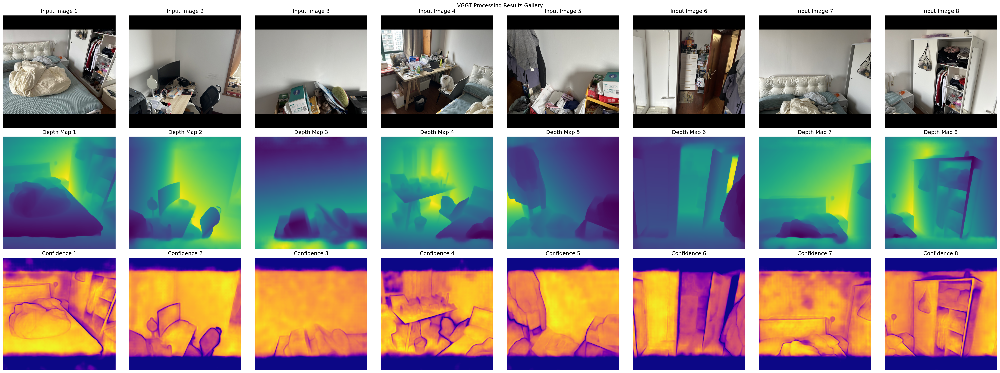

Step 4: Create 3D point cloud visualization


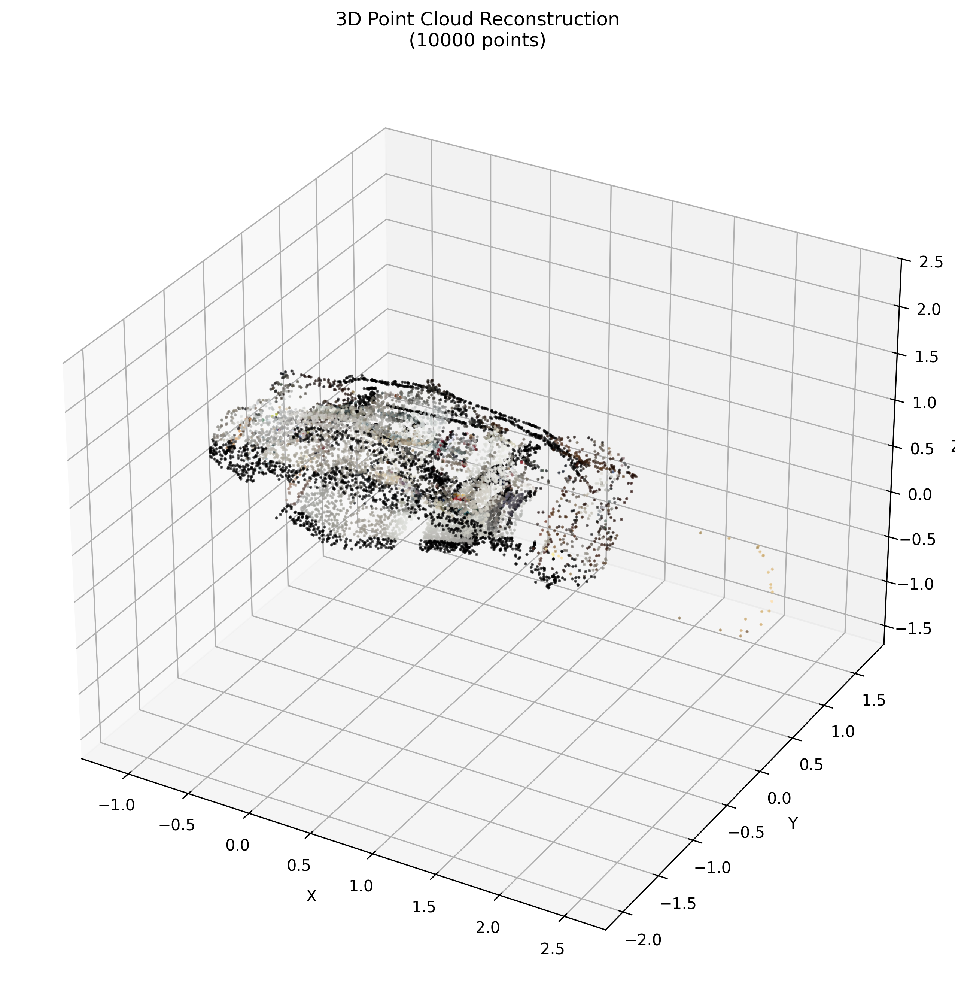


Processing complete! Generated 17 visualization files.
3D point cloud with 10000 points saved to: notebooks/demo_gradio/outputs/point_clouds/pointcloud_3d.png


In [9]:
# Simulate Gradio processing pipeline
print("=== Simulating Gradio Interface Processing ===")
print("Step 1: User uploads images")
print("Step 2: Process images with VGGT")

# Run the main processing function
results = process_images_with_vggt(image_path_strs, output_base_dir)

print("Step 3: Generate visualization outputs")
visualization_files = create_visualizations(results, output_base_dir)

print("Step 4: Create 3D point cloud visualization")
pointcloud_file, num_points = create_3d_visualization(results, output_base_dir)

print(f"\nProcessing complete! Generated {len(visualization_files)} visualization files.")
if pointcloud_file:
    print(f"3D point cloud with {num_points} points saved to: {pointcloud_file}")

In [10]:
# Display processing results summary (simulating Gradio output display)
print("\n=== Gradio Interface Results Summary ===")
print(f"Scene processed: {scene_dir.name}")
print(f"Number of input images: {len(results['images'])}")
print(f"Image resolution: {results['images'].shape[-2:]}")
print(f"Device used: {device}")
print(f"Data type: {dtype}")

# Show camera parameters info (skip detailed display due to tensor format complexity)
intrinsics = results['intrinsics']
extrinsics = results['extrinsics']

print(f"\nCamera Parameters:")
print(f"Generated {len(intrinsics)} camera intrinsic matrices")
print(f"Generated {len(extrinsics)} camera extrinsic matrices")
print(f"Intrinsics shape: {intrinsics.shape if hasattr(intrinsics, 'shape') else 'Variable'}")
print(f"Extrinsics shape: {extrinsics.shape if hasattr(extrinsics, 'shape') else 'Variable'}")

print(f"\nOutput Files Generated:")
for file_path in visualization_files:
    print(f"- {file_path}")
if pointcloud_file:
    print(f"- {pointcloud_file}")


=== Gradio Interface Results Summary ===
Scene processed: room
Number of input images: 8
Image resolution: torch.Size([518, 518])
Device used: cpu
Data type: torch.float32

Camera Parameters:
Generated 1 camera intrinsic matrices
Generated 1 camera extrinsic matrices
Intrinsics shape: torch.Size([1, 8, 3, 3])
Extrinsics shape: torch.Size([1, 8, 3, 4])

Output Files Generated:
- notebooks/demo_gradio/outputs/depth_maps/depth_1.png
- notebooks/demo_gradio/outputs/depth_maps/depth_2.png
- notebooks/demo_gradio/outputs/depth_maps/depth_3.png
- notebooks/demo_gradio/outputs/depth_maps/depth_4.png
- notebooks/demo_gradio/outputs/depth_maps/depth_5.png
- notebooks/demo_gradio/outputs/depth_maps/depth_6.png
- notebooks/demo_gradio/outputs/depth_maps/depth_7.png
- notebooks/demo_gradio/outputs/depth_maps/depth_8.png
- notebooks/demo_gradio/outputs/confidence_maps/confidence_1.png
- notebooks/demo_gradio/outputs/confidence_maps/confidence_2.png
- notebooks/demo_gradio/outputs/confidence_maps/co

In [11]:
# Create downloadable results manifest (simulating Gradio download feature)
manifest = {
    "session_info": {
        "scene": scene_dir.name,
        "num_images": len(results['images']),
        "resolution": list(results['images'].shape[-2:]),
        "device": device,
        "dtype": str(dtype),
        "processing_date": "2025-09-18"
    },
    "outputs": {
        "depth_maps": [str(f) for f in Path(output_base_dir / "depth_maps").glob("*.png")],
        "confidence_maps": [str(f) for f in Path(output_base_dir / "confidence_maps").glob("*.png")],
        "point_clouds": [str(f) for f in Path(output_base_dir / "point_clouds").glob("*.png")],
        "gallery": [str(f) for f in Path(output_base_dir / "gallery").glob("*.png")]
    },
    "camera_parameters": {
        "intrinsics_shape": f"{len(intrinsics)} cameras, each {intrinsics[0].shape}",
        "extrinsics_shape": f"{len(extrinsics)} cameras, each {extrinsics[0].shape}",
        "note": "Full camera parameters available in notebook results"
    }
}

# Save manifest
manifest_file = output_base_dir / "session_manifest.json"
with open(manifest_file, 'w') as f:
    json.dump(manifest, f, indent=2)

print(f"\nSession manifest saved to: {manifest_file}")
print("\n=== Gradio Simulation Complete ===")
print("In a real Gradio interface, users would now be able to:")
print("- View interactive 3D point clouds")
print("- Download all generated files")
print("- Adjust confidence thresholds")
print("- Upload new image sets for processing")


Session manifest saved to: notebooks/demo_gradio/outputs/session_manifest.json

=== Gradio Simulation Complete ===
In a real Gradio interface, users would now be able to:
- View interactive 3D point clouds
- Download all generated files
- Adjust confidence thresholds
- Upload new image sets for processing
